# 计算机视觉大作业

In [3]:
import numpy
import torch
import numpy as np
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
from collections import Counter
import sklearn
from matplotlib import pyplot as plt
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, deprocess_image, preprocess_image
import cv2
import os
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from PIL import Image
from tqdm import tqdm
print('plant')

plant


数据导入和预处理

In [2]:
path = 'plant_dataset\\train\\train_label.csv'
df = pd.read_csv(path)
df.head(20)

,images,labels
0,a8ab965f868fc44c.jpg,healthy
1,a5d8924f7fad18a0.jpg,healthy
2,fab3f2b1c0d2a982.jpg,scab
3,d9b283cd98b19d13.jpg,scab
4,852979c129dde25d.jpg,frog_eye_leaf_spot
5,b76b84406eb75545.jpg,healthy
6,c1a972977e88b49c.jpg,complex
7,ba3457285a4655e7.jpg,scab
8,f2d5d2adc18c6986.jpg,scab
9,e0f996008ddabf0d.jpg,frog_eye_leaf_spot


In [3]:
df.describe()

,images,labels
count,3000,3000
unique,3000,12
top,a8ab965f868fc44c.jpg,scab
freq,1,767


In [4]:
data = np.array(df)
labels = data[:, 1]
mlb = MultiLabelBinarizer(classes=['rust','scab','powdery_mildew','frog_eye_leaf_spot','complex']) # 多标签编码器
one_hot_encoded = mlb.fit_transform([set(label.split()) for label in labels])
result = np.column_stack((data[:, 0], one_hot_encoded))
I=np.eye(5)
print(I)
print(mlb.inverse_transform(I))
# 输出结果
print(result[:20,:])

[[1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1.]]
[('rust',), ('scab',), ('powdery_mildew',), ('frog_eye_leaf_spot',), ('complex',)]
[['a8ab965f868fc44c.jpg' 0 0 0 0 0]
 ['a5d8924f7fad18a0.jpg' 0 0 0 0 0]
 ['fab3f2b1c0d2a982.jpg' 0 1 0 0 0]
 ['d9b283cd98b19d13.jpg' 0 1 0 0 0]
 ['852979c129dde25d.jpg' 0 0 0 1 0]
 ['b76b84406eb75545.jpg' 0 0 0 0 0]
 ['c1a972977e88b49c.jpg' 0 0 0 0 1]
 ['ba3457285a4655e7.jpg' 0 1 0 0 0]
 ['f2d5d2adc18c6986.jpg' 0 1 0 0 0]
 ['e0f996008ddabf0d.jpg' 0 0 0 1 0]
 ['bb2ad8e69a846699.jpg' 0 0 0 0 0]
 ['c225cf8aba4eb952.jpg' 0 0 0 0 0]
 ['bfc86719271047f1.jpg' 0 1 0 0 0]
 ['f5b1809b4c867c6e.jpg' 0 0 0 0 0]
 ['9f1061a618f3fcc9.jpg' 0 0 1 0 0]
 ['dab12ed9c1ce0ce1.jpg' 0 0 0 1 0]
 ['9742c28e983ef46b.jpg' 0 1 0 1 0]
 ['ca23cf4e3ce73430.jpg' 0 1 0 0 0]
 ['aa1620058fbfbcad.jpg' 0 1 0 0 0]
 ['c1b7659f9a9214d2.jpg' 0 1 0 0 0]]


D:\anaconda1\lib\site-packages\sklearn\preprocessing\_label.py:875: UserWarning: unknown class(es) ['healthy'] will be ignored
  warnings.warn(


In [5]:
all_labels = np.unique([ lbl for label in df['labels'].value_counts().keys() for lbl in label.split(' ') ])
all_labels

array(['complex', 'frog_eye_leaf_spot', 'healthy', 'powdery_mildew',
       'rust', 'scab'], dtype='<U18')

In [6]:
label_count = pd.DataFrame(columns=['label', 'count'])
for lbl in all_labels:
    count = df[df['labels'].str.contains(lbl)].count()[0]
    label_count = pd.concat([label_count,pd.DataFrame([{'label': lbl, 'count': count}])], ignore_index=True)
display(label_count)

,label,count
0,complex,355
1,frog_eye_leaf_spot,701
2,healthy,753
3,powdery_mildew,197
4,rust,347
5,scab,897


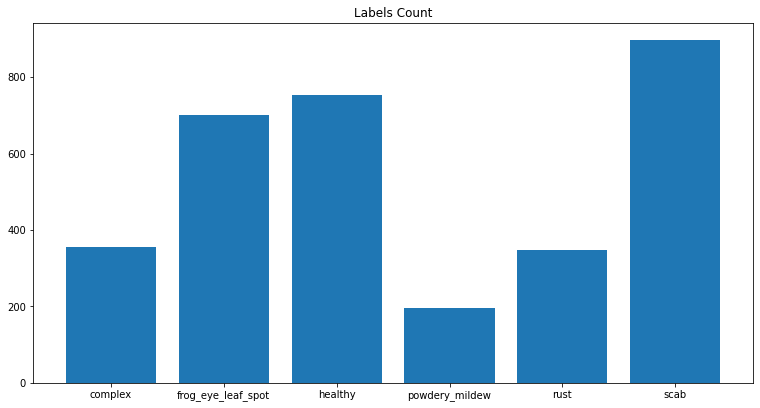

In [7]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0, 0, 1, 1])
ax.bar(label_count['label'], label_count['count'])
plt.title('Labels Count')
plt.show()

In [8]:
import cv2
import os
def norm(img):
    img = np.array(img)
    img = img.astype(np.float32)
    img -= img.min()
    img /= img.max()
    return img
def show_samples(df, class_name, path):
    plt.figure(figsize=(20, 10))
    labeled_only = df[df.labels==class_name]
    for i in range(min(len(labeled_only), 4)):
        img_name = labeled_only.iloc[i].images
        plt.subplot(3, 4, i + 1)
        plt.title(class_name)
        plt.axis('off')
        img_path = os.path.join(path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
        plt.imshow(norm(img))
    plt.tight_layout()
    plt.show()

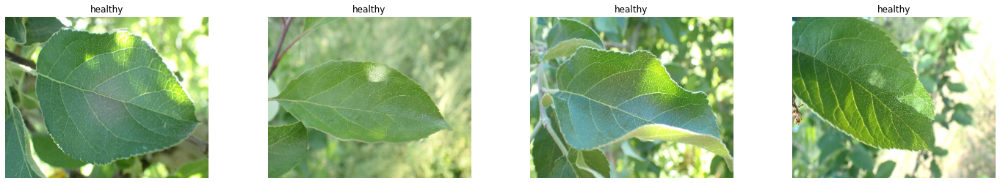

In [9]:
images_folder='plant_dataset/train/images'
show_samples(df, 'healthy', images_folder)

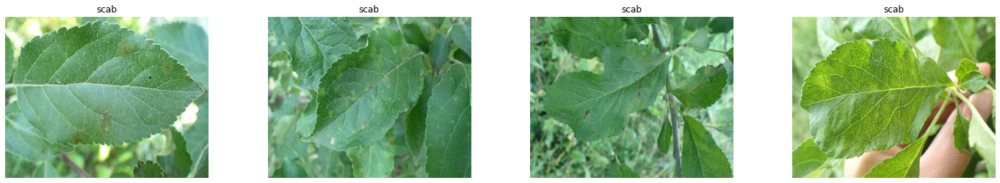

In [11]:
show_samples(df, 'scab', images_folder)

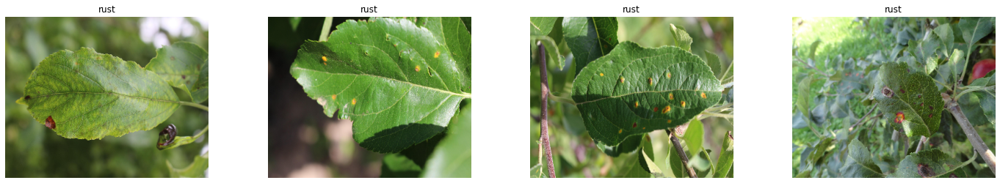

In [12]:
show_samples(df, 'rust', images_folder)

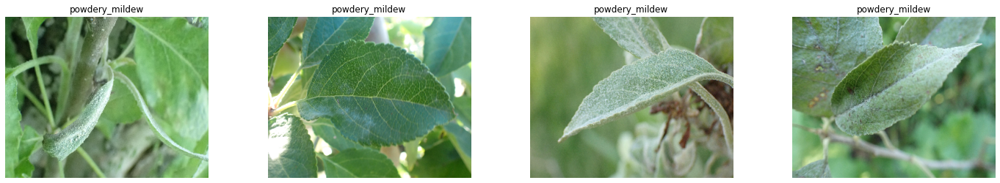

In [13]:
show_samples(df, 'powdery_mildew', images_folder)

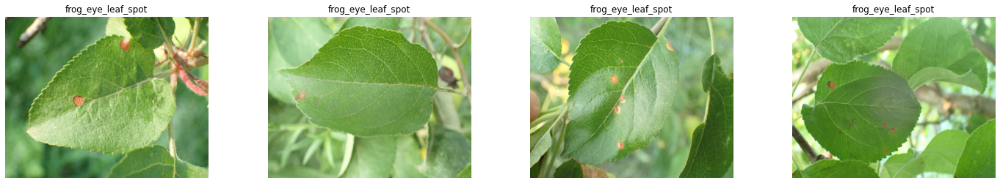

In [14]:
show_samples(df, 'frog_eye_leaf_spot', images_folder)

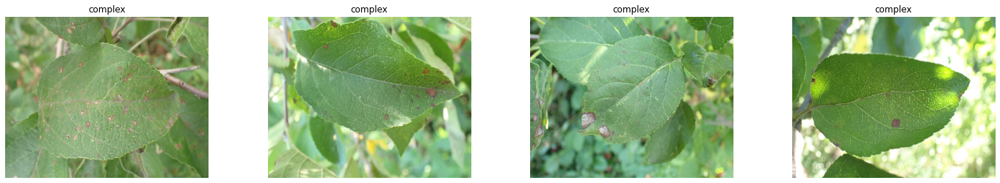

In [15]:
show_samples(df, 'complex', images_folder)

In [10]:
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from PIL import Image
from tqdm import tqdm

In [11]:
# 数据预处理
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [12]:
# 自定义数据集类
class CustomDataset(Dataset):
    def __init__(self, root_dir, csv_file, transform=None):
        self.root_dir = root_dir
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.mlb = mlb

        # 将多标签转换为one-hot编码
        self.labels_onehot = self.mlb.fit_transform(self.data['labels'].apply(lambda x: x.split()))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data.iloc[idx, 0])
        image = Image.open(img_name).convert('RGB')
        label_onehot = torch.tensor(self.labels_onehot[idx])

        if self.transform:
            image = self.transform(image)

        # 返回图像和标签
        return image, label_onehot

# 加载训练数据、验证数据和测试数据
train_dataset = CustomDataset(root_dir='plant_dataset/train/images', csv_file='plant_dataset/train/train_label.csv', transform=transform)
val_dataset = CustomDataset(root_dir='plant_dataset/val/images', csv_file='plant_dataset/val/val_label.csv', transform=transform)
test_dataset = CustomDataset(root_dir='plant_dataset/test/images', csv_file='plant_dataset/test/test_label.csv', transform=transform)

D:\anaconda1\lib\site-packages\sklearn\preprocessing\_label.py:875: UserWarning: unknown class(es) ['healthy'] will be ignored
  warnings.warn(
D:\anaconda1\lib\site-packages\sklearn\preprocessing\_label.py:875: UserWarning: unknown class(es) ['healthy'] will be ignored
  warnings.warn(
D:\anaconda1\lib\site-packages\sklearn\preprocessing\_label.py:875: UserWarning: unknown class(es) ['healthy'] will be ignored
  warnings.warn(


In [13]:
# 定义ResNet模型
class ResNetModel(nn.Module):
    def __init__(self, num_classes):
        super(ResNetModel, self).__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

# 修改损失函数为适用于多标签分类的损失函数
class MultiLabelCrossEntropyLoss(nn.Module):
    def __init__(self):
        super(MultiLabelCrossEntropyLoss, self).__init__()
        self.loss_fn = nn.BCEWithLogitsLoss()

    def forward(self, outputs, targets):
        return self.loss_fn(outputs, targets)

In [14]:
# 定义数据加载器
batch_size=32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [15]:
# 初始化模型、损失函数和优化器
num_classes = len(train_dataset.mlb.classes_)
num_classes=5
print(num_classes)
model = ResNetModel(num_classes)
criterion = MultiLabelCrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

5


In [16]:
num_epochs = 5
train_acc=[0 for _ in range(num_epochs)]
valid_acc=[0 for _ in range(num_epochs)]
test_acc=[0 for _ in range(num_epochs)]
Train_loss=[0 for _ in range(num_epochs)]
Valid_loss=[0 for _ in range(num_epochs)]
Test_loss=[0 for _ in range(num_epochs)]

In [19]:
# model.load_state_dict(torch.load("model2_param2.pth"))

<All keys matched successfully>

In [17]:
# 训练模型
for epoch in range(num_epochs):
    model.train()
    for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Epoch {epoch + 1}/{num_epochs}')):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
    # 在训练集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    train_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Evaluate Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            train_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Train Evaluate {epoch+1}/{num_epochs}, Train Loss: {train_loss/len(train_loader)}')
    accuracy = correct_total / total_samples
    print(f'Train Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Train_loss[epoch]=train_loss/len(train_loader)
    train_acc[epoch]=accuracy
    # 在验证集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(val_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            val_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Val Epoch {epoch+1}/{num_epochs}, Val Loss: {val_loss/len(val_loader)}')
    accuracy = correct_total / total_samples
    print(f'Val Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Valid_loss[epoch]=val_loss/len(val_loader)
    valid_acc[epoch]=accuracy
    # 在测试集上进行最终评估
    test_loss = 0.0
    correct_total = 0
    total_samples = 0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            loss = criterion(outputs, labels.float())
            test_loss += loss.item()
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
#             if batch_idx==2:
#                 print(outputs)
#                 print(predicted)
#                 print(labels)
#                 print(matching_rows)
#                 print(correct_total)

    average_test_loss = test_loss / len(test_loader)
    print(f'Final Test Loss: {average_test_loss:.4f}')
    accuracy = correct_total / total_samples
    print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Test_loss[epoch]=test_loss/len(test_loader)
    test_acc[epoch]=accuracy
    model_w='model4_param'+str(epoch)+'.pth'
    torch.save(model.state_dict(), model_w)

Train Evaluate Epoch 1/5: 100%|████████████████████████████████████████████████████████| 94/94 [12:11<00:00,  7.79s/it]


Train Evaluate 1/5, Train Loss: 0.1826014667749405
Train Final Accuracy: 74.90%,total_samples/correct_total:2247/3000


Epoch 1/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:21<00:00,  7.44s/it]


Val Epoch 1/5, Val Loss: 0.17502321302890778
Val Final Accuracy: 75.17%,total_samples/correct_total:451/600


Epoch 1/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:16<00:00,  7.16s/it]


Final Test Loss: 0.1801
Final Accuracy: 72.83%,total_samples/correct_total:437/600


Train Evaluate Epoch 2/5: 100%|████████████████████████████████████████████████████████| 94/94 [11:51<00:00,  7.57s/it]


Train Evaluate 2/5, Train Loss: 0.22865936160087585
Train Final Accuracy: 67.63%,total_samples/correct_total:2029/3000


Epoch 2/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:24<00:00,  7.61s/it]


Val Epoch 2/5, Val Loss: 0.23288066685199738
Val Final Accuracy: 68.67%,total_samples/correct_total:412/600


Epoch 2/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:24<00:00,  7.61s/it]


Final Test Loss: 0.2437
Final Accuracy: 68.00%,total_samples/correct_total:408/600


Train Evaluate Epoch 3/5: 100%|████████████████████████████████████████████████████████| 94/94 [11:46<00:00,  7.52s/it]


Train Evaluate 3/5, Train Loss: 0.16697649657726288
Train Final Accuracy: 76.57%,total_samples/correct_total:2297/3000


Epoch 3/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:18<00:00,  7.31s/it]


Val Epoch 3/5, Val Loss: 0.1800839751958847
Val Final Accuracy: 74.67%,total_samples/correct_total:448/600


Epoch 3/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:20<00:00,  7.39s/it]


Final Test Loss: 0.1769
Final Accuracy: 74.83%,total_samples/correct_total:449/600


Train Evaluate Epoch 4/5: 100%|████████████████████████████████████████████████████████| 94/94 [11:46<00:00,  7.52s/it]


Train Evaluate 4/5, Train Loss: 0.33952176570892334
Train Final Accuracy: 52.20%,total_samples/correct_total:1566/3000


Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:26<00:00,  7.72s/it]


Val Epoch 4/5, Val Loss: 0.34162285923957825
Val Final Accuracy: 55.00%,total_samples/correct_total:330/600


Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:27<00:00,  7.76s/it]


Final Test Loss: 0.3600
Final Accuracy: 49.17%,total_samples/correct_total:295/600


Train Evaluate Epoch 5/5: 100%|████████████████████████████████████████████████████████| 94/94 [11:44<00:00,  7.49s/it]


Train Evaluate 5/5, Train Loss: 0.12629224359989166
Train Final Accuracy: 84.43%,total_samples/correct_total:2533/3000


Epoch 5/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:19<00:00,  7.36s/it]


Val Epoch 5/5, Val Loss: 0.13415099680423737
Val Final Accuracy: 83.00%,total_samples/correct_total:498/600


Epoch 5/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:24<00:00,  7.58s/it]

Final Test Loss: 0.1451
Final Accuracy: 80.33%,total_samples/correct_total:482/600


In [20]:
for i in range(3):
    train_acc.append(0)
    valid_acc.append(0)
    test_acc.append(0)
    Train_loss.append(0)
    Valid_loss.append(0)
    Test_loss.append(0)

In [22]:
# Train_loss
num_epochs=8
model.load_state_dict(torch.load("model4_param4.pth"))

<All keys matched successfully>

In [23]:
# 训练模型
for epoch in range(5,8):
    model.train()
    for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Epoch {epoch + 1}/{num_epochs}')):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
    # 在训练集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    train_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Evaluate Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            train_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Train Evaluate {epoch+1}/{num_epochs}, Train Loss: {train_loss/len(train_loader)}')
    accuracy = correct_total / total_samples
    print(f'Train Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Train_loss[epoch]=train_loss/len(train_loader)
    train_acc[epoch]=accuracy
    # 在验证集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(val_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            val_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Val Epoch {epoch+1}/{num_epochs}, Val Loss: {val_loss/len(val_loader)}')
    accuracy = correct_total / total_samples
    print(f'Val Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Valid_loss[epoch]=val_loss/len(val_loader)
    valid_acc[epoch]=accuracy
    # 在测试集上进行最终评估
    test_loss = 0.0
    correct_total = 0
    total_samples = 0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            loss = criterion(outputs, labels.float())
            test_loss += loss.item()
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
#             if batch_idx==2:
#                 print(outputs)
#                 print(predicted)
#                 print(labels)
#                 print(matching_rows)
#                 print(correct_total)

    average_test_loss = test_loss / len(test_loader)
    print(f'Final Test Loss: {average_test_loss:.4f}')
    accuracy = correct_total / total_samples
    print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Test_loss[epoch]=test_loss/len(test_loader)
    test_acc[epoch]=accuracy
    model_w='model4_param'+str(epoch)+'.pth'
    torch.save(model.state_dict(), model_w)

Train Evaluate Epoch 6/8: 100%|████████████████████████████████████████████████████████| 94/94 [11:16<00:00,  7.19s/it]


Train Evaluate 6/8, Train Loss: 0.10866418480873108
Train Final Accuracy: 84.50%,total_samples/correct_total:2535/3000


Epoch 6/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:15<00:00,  7.12s/it]


Val Epoch 6/8, Val Loss: 0.12776237726211548
Val Final Accuracy: 83.17%,total_samples/correct_total:499/600


Epoch 6/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:14<00:00,  7.07s/it]


Final Test Loss: 0.1537
Final Accuracy: 79.67%,total_samples/correct_total:478/600


Train Evaluate Epoch 7/8: 100%|████████████████████████████████████████████████████████| 94/94 [11:15<00:00,  7.19s/it]


Train Evaluate 7/8, Train Loss: 0.17217500507831573
Train Final Accuracy: 77.80%,total_samples/correct_total:2334/3000


Epoch 7/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:16<00:00,  7.18s/it]


Val Epoch 7/8, Val Loss: 0.20937642455101013
Val Final Accuracy: 77.00%,total_samples/correct_total:462/600


Epoch 7/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:14<00:00,  7.10s/it]


Final Test Loss: 0.2174
Final Accuracy: 74.67%,total_samples/correct_total:448/600


Train Evaluate Epoch 8/8: 100%|████████████████████████████████████████████████████████| 94/94 [11:14<00:00,  7.17s/it]


Train Evaluate 8/8, Train Loss: 0.10685224086046219
Train Final Accuracy: 84.97%,total_samples/correct_total:2549/3000


Epoch 8/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:15<00:00,  7.11s/it]


Val Epoch 8/8, Val Loss: 0.12009549140930176
Val Final Accuracy: 84.00%,total_samples/correct_total:504/600


Epoch 8/8: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:14<00:00,  7.09s/it]

Final Test Loss: 0.1447
Final Accuracy: 80.50%,total_samples/correct_total:483/600


In [24]:
for i in range(2):
    train_acc.append(0)
    valid_acc.append(0)
    test_acc.append(0)
    Train_loss.append(0)
    Valid_loss.append(0)
    Test_loss.append(0)

In [26]:
print(Train_loss)
num_epochs=10
# model.load_state_dict(torch.load("model4_param4.pth"))

[tensor(0.1826), tensor(0.2287), tensor(0.1670), tensor(0.3395), tensor(0.1263), tensor(0.1087), tensor(0.1722), tensor(0.1069), 0, 0]


In [27]:
# 训练模型
for epoch in range(8,10):
    model.train()
    for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Epoch {epoch + 1}/{num_epochs}')):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
    # 在训练集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    train_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(train_loader, desc=f'Train Evaluate Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            train_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Train Evaluate {epoch+1}/{num_epochs}, Train Loss: {train_loss/len(train_loader)}')
    accuracy = correct_total / total_samples
    print(f'Train Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Train_loss[epoch]=train_loss/len(train_loader)
    train_acc[epoch]=accuracy
    # 在验证集上评估模型
    correct_total = 0
    total_samples = 0
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(val_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            val_loss += criterion(outputs, labels.float())
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
    print(f'Val Epoch {epoch+1}/{num_epochs}, Val Loss: {val_loss/len(val_loader)}')
    accuracy = correct_total / total_samples
    print(f'Val Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Valid_loss[epoch]=val_loss/len(val_loader)
    valid_acc[epoch]=accuracy
    # 在测试集上进行最终评估
    test_loss = 0.0
    correct_total = 0
    total_samples = 0
    with torch.no_grad():
        for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
            outputs = model(inputs)
            loss = criterion(outputs, labels.float())
            test_loss += loss.item()
            predicted = outputs > 0
            matching_rows = torch.where((predicted == labels).all(dim=1))[0]
            correct_total+=len(matching_rows)
            total_samples += labels.size(0)
#             if batch_idx==2:
#                 print(outputs)
#                 print(predicted)
#                 print(labels)
#                 print(matching_rows)
#                 print(correct_total)

    average_test_loss = test_loss / len(test_loader)
    print(f'Final Test Loss: {average_test_loss:.4f}')
    accuracy = correct_total / total_samples
    print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')
    Test_loss[epoch]=test_loss/len(test_loader)
    test_acc[epoch]=accuracy
    model_w='model4_param'+str(epoch)+'.pth'
    torch.save(model.state_dict(), model_w)

Train Evaluate Epoch 9/10: 100%|███████████████████████████████████████████████████████| 94/94 [11:53<00:00,  7.59s/it]


Train Evaluate 9/10, Train Loss: 0.13745960593223572
Train Final Accuracy: 80.90%,total_samples/correct_total:2427/3000


Epoch 9/10: 100%|██████████████████████████████████████████████████████████████████████| 19/19 [02:24<00:00,  7.62s/it]


Val Epoch 9/10, Val Loss: 0.18042363226413727
Val Final Accuracy: 78.50%,total_samples/correct_total:471/600


Epoch 9/10: 100%|██████████████████████████████████████████████████████████████████████| 19/19 [02:24<00:00,  7.58s/it]


Final Test Loss: 0.2036
Final Accuracy: 76.17%,total_samples/correct_total:457/600


Train Evaluate Epoch 10/10: 100%|██████████████████████████████████████████████████████| 94/94 [11:45<00:00,  7.50s/it]


Train Evaluate 10/10, Train Loss: 0.12690101563930511
Train Final Accuracy: 81.50%,total_samples/correct_total:2445/3000


Epoch 10/10: 100%|█████████████████████████████████████████████████████████████████████| 19/19 [02:20<00:00,  7.38s/it]


Val Epoch 10/10, Val Loss: 0.1701957732439041
Val Final Accuracy: 77.00%,total_samples/correct_total:462/600


Epoch 10/10: 100%|█████████████████████████████████████████████████████████████████████| 19/19 [02:17<00:00,  7.23s/it]

Final Test Loss: 0.2001
Final Accuracy: 73.50%,total_samples/correct_total:441/600


Text(0, 0.5, 'loss')

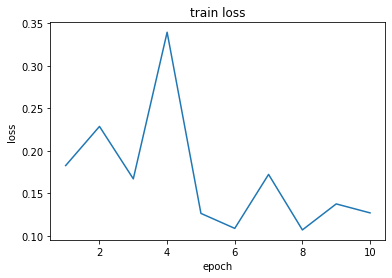

In [28]:
plt.plot(range(1,num_epochs+1),Train_loss)
plt.title('train loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'loss')

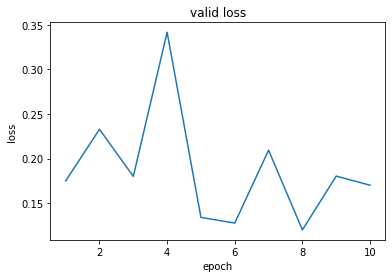

In [29]:
plt.plot(range(1,num_epochs+1),Valid_loss)
plt.title('valid loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'loss')

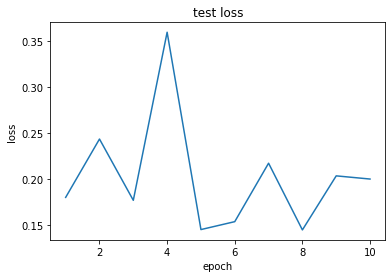

In [30]:
plt.plot(range(1,num_epochs+1),Test_loss)
plt.title('test loss')
plt.xlabel('epoch')
plt.ylabel('loss')

Text(0, 0.5, 'accuracy')

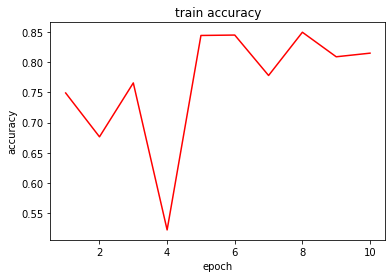

In [31]:
plt.plot(range(1,num_epochs+1),train_acc,color='red')
plt.title('train accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

Text(0, 0.5, 'accuracy')

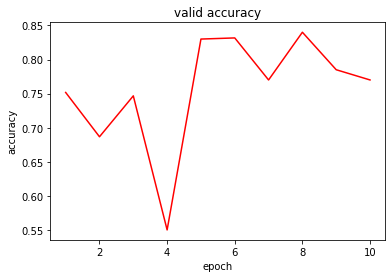

In [32]:
plt.plot(range(1,num_epochs+1),valid_acc,color='red')
plt.title('valid accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

Text(0, 0.5, 'accuracy')

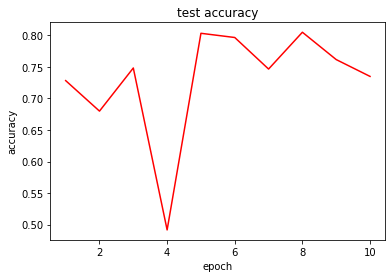

In [33]:
plt.plot(range(1,num_epochs+1),test_acc,color='red')
plt.title('test accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')

In [24]:
for name,module in model._modules.items():
        print(name)
print(list(model.children()))

resnet
[ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=

In [51]:
dir(model.resnet)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_impl',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_post_hooks',
 '_load_state_dict_pre_hooks',
 '_make_layer',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_norm_layer',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dic

In [25]:
# epoch=2是模型最优，加载模型 2
# model.load_state_dict(torch.load("model2_param2.pth"))

<All keys matched successfully>

In [26]:
# 在测试集上进行最终评估
test_loss = 0.0
correct_total = 0
total_samples = 0
epoch=3
with torch.no_grad():
    for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        test_loss += loss.item()
        predicted = outputs >0
        matching_rows = torch.where((predicted == labels).all(dim=1))[0]
        correct_total+=len(matching_rows)
        total_samples += labels.size(0)
        total_rows=len(labels)
        all_rows = torch.arange(total_rows)
        incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
        incorrect_rows = incorrect_rows.tolist()
        for i in matching_rows:
            print('label:',labels[i],'predicted:',predicted[i],'outputs:',outputs[i])
average_test_loss = test_loss / len(test_loader)
print(f'Final Test Loss: {average_test_loss:.4f}')
accuracy = correct_total / total_samples
print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')

Epoch 4/5:   5%|███▊                                                                    | 1/19 [00:07<02:19,  7.75s/it]

label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-3.4974, -4.8237, -4.0871,  2.8836, -4.7577, -3.0086])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.7249, -6.4452, -4.6233, -4.7884, -5.8615,  3.2257])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.5220, -4.0867, -9.2353, -7.2967, -5.0381,  3.9083])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.8721, -4.8779, -7.9539, -6.3492, -5.0568,  3.4308])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.6615, -7.2188,  6.8535, -8.1065, -9.4352, -8.3894])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: t


Epoch 4/5:  11%|███████▌                                                                | 2/19 [00:15<02:08,  7.58s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.4804, -3.1731, -8.8404, -8.7794,  4.9134, -4.9305])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -5.4136,   2.4383, -10.4675, -10.9811,  -0.8096,  -5.8965])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -5.7386,   4.7844, -11.0294, -12.0657,  -6.4795,  -4.4909])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-6.6456, -6.8749, -5.7479, -5.8493, -6.9479,  4.1065])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.8458, -4.9997, -8.7185, -6.1663, -6.5379,  4.4405])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) 


Epoch 4/5:  16%|███████████▎                                                            | 3/19 [00:22<01:57,  7.37s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.6450, -6.1732,  4.1048, -6.1229, -7.9136, -5.5334])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.7936,  1.6053, -5.4338, -5.8798, -2.7224, -3.3554])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.9449, -5.3667,  4.6249, -5.0048, -7.9666, -5.7818])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-1.6530, -3.3246, -4.9707,  1.3313, -4.3186, -1.8712])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -3.5523,  -3.9270, -12.6376, -11.8570,   7.7437,  -8.1972])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predic


Epoch 4/5:  21%|███████████████▏                                                        | 4/19 [00:29<01:49,  7.30s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.0345, -6.9783,  4.5434, -6.5857, -8.6678, -4.8598])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -9.8707,  -8.6007,   5.0043,  -7.6732, -10.1165,  -5.2174])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -7.7383,   7.5260,  -9.3343, -10.9385,  -9.1367,  -5.9486])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.7888, -4.4017, -9.5766, -6.8735, -5.9903,  4.6320])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.4734, -3.4453, -8.8689, -7.6556,  4.8203, -5.4674])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) 


Epoch 4/5:  26%|██████████████████▉                                                     | 5/19 [00:37<01:43,  7.39s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-13.0758,   9.2033, -15.7382, -18.2327,  -7.1885,  -9.4354])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.5175, -5.6664, -7.5251, -6.3305, -5.2244,  4.0308])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-3.9873, -1.6674, -7.8585, -9.0982,  3.6493, -5.3398])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.0120, -5.0003, -5.3180, -4.7569, -4.8626,  2.4995])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.7124, -4.4820, -9.6608, -7.6437, -6.1040,  4.4461])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predic


Epoch 4/5:  32%|██████████████████████▋                                                 | 6/19 [00:44<01:36,  7.41s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -4.9522,  -5.8831, -10.2371,  -8.9581,  -5.2651,   4.9980])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-2.1737,  2.5978, -6.4409, -5.9622, -5.1070, -2.6587])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.3239, -4.4887,  2.4189, -3.7678, -7.9652, -3.7119])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -1.8050,  -3.6857, -11.6024,  -9.5030,   5.9281,  -6.7642])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.8092, -7.2663, -8.3428, -7.5495, -6.1899,  5.1351])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) 


Epoch 4/5:  37%|██████████████████████████▌                                             | 7/19 [00:51<01:28,  7.40s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-0.7824, -0.2705, -7.7405, -6.0230, -3.6638,  0.6000])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -3.2545,  -3.7691, -12.0141, -10.8002,   7.1723,  -7.5868])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.3277, -5.5009, -3.3084, -4.6100, -5.3343,  1.7438])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -6.0202,  -6.5133, -13.2064, -10.3257,  -7.6947,   7.0857])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-13.0128, -10.0107,  10.4807, -11.3881, -13.6767, -12.1643])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.i


Epoch 4/5:  42%|██████████████████████████████▎                                         | 8/19 [00:59<01:22,  7.46s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -5.4492,   5.1454,  -9.6103, -10.2880,  -7.1236,  -4.2517])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -8.3794,  -9.5175, -11.4936, -10.2548,  -9.1917,   7.5230])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.1036, -6.2888, -9.7194, -7.7651, -7.1976,  5.4275])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-5.4288, -5.5623,  1.9741, -4.9966, -3.8900, -2.4529])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.0165, -4.3029, -2.9913, -3.8984, -4.5580,  0.6757])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) 


Epoch 4/5:  47%|██████████████████████████████████                                      | 9/19 [01:07<01:15,  7.51s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.2757, -4.9837, -8.6877, -6.8874, -6.4998,  4.5207])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.7196, -7.4433,  3.5196, -6.7042, -8.0714, -4.0533])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-11.9136,  -9.3694,   8.2512, -10.1325, -12.2992,  -9.2531])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.3707, -5.4615, -6.4467, -5.2332, -5.3791,  3.5888])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -9.8579,  -7.4951,   5.6687,  -6.6616, -10.3509,  -6.6325])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) 


Epoch 4/5:  53%|█████████████████████████████████████▎                                 | 10/19 [01:14<01:08,  7.58s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-5.0029, -4.4144,  1.7712, -3.3695, -5.6989, -2.6137])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -3.5932,  -5.3274, -16.6668, -15.4377,   9.6358,  -9.6083])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-10.0219,  -7.7679,   6.7601,  -7.7163, -10.8251,  -8.0619])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-6.7693, -5.4288,  4.6893, -5.0343, -7.9945, -6.1758])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.9938, -3.8125, -9.5640, -7.3508, -2.3991,  2.5285])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) 


Epoch 4/5:  58%|█████████████████████████████████████████                              | 11/19 [01:22<01:00,  7.58s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -9.7892,  -7.6356,   7.2399,  -7.8880, -10.6309,  -8.4112])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.1009, -6.0808, -8.4025, -6.5271, -7.2193,  4.6809])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.7006, -7.4399,  5.1209, -6.4548, -9.3844, -5.8086])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -6.1354,   5.9395, -10.1594, -10.1109,  -9.6202,  -4.1904])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-10.0432,  -8.3439,   5.9827,  -7.7829, -10.9745,  -6.4892])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.i


Epoch 4/5:  63%|████████████████████████████████████████████▊                          | 12/19 [01:29<00:52,  7.57s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.8318, -5.6642, -2.5174, -3.7950, -5.7250,  1.4942])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 0.7876, -1.2113, -5.4852, -3.6492, -1.4150, -1.6874])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-5.8796, -5.3076,  3.1448, -4.9002, -5.6819, -3.8562])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.6544, -4.8698, -6.7537, -6.0216, -3.5496,  3.1906])
label: tensor([0, 0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False, False]) outputs: tensor([-4.3559, -3.5442, -3.7277,  2.4581, -6.9097, -2.7355])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: t


Epoch 4/5:  68%|████████████████████████████████████████████████▌                      | 13/19 [01:37<00:44,  7.48s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -4.6231,  -4.7067, -16.1711, -13.9003,   9.6745, -10.6345])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-0.7411,  0.9659, -7.8610, -6.3745, -4.6370, -0.9538])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-5.6667,  3.4892, -6.2482, -8.3126, -3.4985, -4.3331])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-8.2503, -7.4477,  3.1877, -6.6879, -8.8715, -3.7057])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-3.7676, -5.0203, -3.2070, -4.3118, -4.8300,  1.6290])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predic


Epoch 4/5:  74%|████████████████████████████████████████████████████▎                  | 14/19 [01:44<00:37,  7.45s/it]

label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.0854, -3.9046,  0.8628, -4.9766, -1.8263, -2.7844])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-1.6353, -3.3697, -9.4754, -8.3460,  4.3967, -4.9961])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-7.2235, -8.5708, -2.0199, -7.8248, -7.9288,  1.2340])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-7.1671,  0.5854, -0.4477, -6.8459, -7.0816, -5.1993])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-1.8543, -3.1569, -6.6627, -4.7543, -4.1958,  2.3991])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: t


Epoch 4/5:  79%|████████████████████████████████████████████████████████               | 15/19 [01:51<00:29,  7.39s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-4.9019, -6.2638, -9.2836, -7.4078, -6.8635,  4.9324])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -4.9492,   3.7013, -10.5723, -10.6984,  -3.9796,  -4.4288])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-11.4431,  -8.7301,   7.0283,  -8.8402, -11.9673,  -8.0231])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([ -9.7386,  -8.4355,   6.7896,  -7.3113, -10.9198,  -8.0095])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -8.2412,  -8.6493, -14.7207, -11.5445,  -9.2348,   8.8930])
label: tensor([0, 1, 0, 0, 0, 0], dtype=t


Epoch 4/5:  84%|███████████████████████████████████████████████████████████▊           | 16/19 [01:59<00:22,  7.37s/it]

label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-2.9577, -3.6884, -6.1862, -5.3293, -4.7750,  2.4733])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 0.8841, -0.2641, -7.3748, -5.2790, -4.6715, -0.3211])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.0080, -3.4077,  1.7008, -4.2496, -5.3574, -2.8641])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([-5.1090, -6.2692, -5.3100, -4.6014, -5.3244,  3.3804])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-1.5825, -2.4229, -6.0847, -4.5598,  1.4785, -2.5288])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: t


Epoch 4/5:  89%|███████████████████████████████████████████████████████████████▌       | 17/19 [02:06<00:14,  7.42s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-3.4222, -3.7270, -8.5250, -9.8423,  5.2419, -6.2138])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.4843, -6.1640,  4.0348, -5.8777, -7.5179, -4.6925])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-11.2389,  -8.0288,   8.2768,  -9.3253, -11.8052,  -9.6866])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-11.1618,   9.1752,  -9.9908, -13.0074, -10.7046,  -7.4494])
label: tensor([1, 0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False, False]) outputs: tensor([ 1.4033, -1.0599, -7.0314, -4.0272, -2.8778, -1.0996])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) 


Epoch 4/5:  95%|███████████████████████████████████████████████████████████████████▎   | 18/19 [02:14<00:07,  7.52s/it]

label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([ -7.8743,   7.0712,  -8.9165, -11.0437,  -8.5973,  -5.7780])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -4.3421,  -4.9686, -10.4469,  -7.1765,  -6.3235,   4.8595])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -4.2883,  -5.3412, -10.3689,  -7.8936,  -5.4716,   4.9767])
label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([-2.3055, -2.8462, -7.8866, -7.7382,  3.6511, -4.1553])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-7.5688, -6.7158,  3.9106, -4.9028, -7.6173, -5.4627])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.i

Epoch 4/5: 100%|███████████████████████████████████████████████████████████████████████| 19/19 [02:20<00:00,  7.39s/it]

label: tensor([0, 0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True, False]) outputs: tensor([ -3.5798,  -3.9616, -13.7246, -13.0594,   7.6801,  -7.6000])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-12.3375,  -9.3048,   9.4710, -10.5032, -12.9264, -11.2617])
label: tensor([0, 0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False, False]) outputs: tensor([-4.6055, -4.1495,  0.9598, -2.0776, -4.9516, -2.2518])
label: tensor([0, 1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False, False]) outputs: tensor([-3.8819,  3.5926, -6.6887, -7.6410, -6.1396, -3.1328])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False,  True]) outputs: tensor([ -5.6499,  -5.5069, -11.4443,  -8.5821,  -7.2102,   6.0948])
label: tensor([0, 0, 0, 0, 0, 1], dtype=torch.i

In [35]:
# 在测试集上进行最终评估
test_loss = 0.0
correct_total = 0
total_samples = 0
epoch=3
print('wrong answer analyse')
with torch.no_grad():
    for batch_idx, (inputs, labels) in enumerate(tqdm(test_loader, desc=f'Epoch {epoch + 1}/{num_epochs}')):
        outputs = model(inputs)
        loss = criterion(outputs, labels.float())
        test_loss += loss.item()
        predicted = outputs >0
        matching_rows = torch.where((predicted == labels).all(dim=1))[0]
        correct_total+=len(matching_rows)
        total_samples += labels.size(0)
        total_rows=len(labels)
        all_rows = torch.arange(total_rows)
        incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
        incorrect_rows = incorrect_rows.tolist()
        for i in incorrect_rows:
            print('label:',labels[i],'predicted:',predicted[i],'outputs:',outputs[i])
average_test_loss = test_loss / len(test_loader)
print(f'Final Test Loss: {average_test_loss:.4f}')
accuracy = correct_total / total_samples
print(f'Final Accuracy: {accuracy:.2%},total_samples/correct_total:{correct_total:.0f}/{total_samples:.0f}')

wrong answer analyse


Epoch 4/10:   5%|███▋                                                                   | 1/19 [00:07<02:15,  7.54s/it]

label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-7.5189, -0.4551, -6.6263, -6.8884, -6.6906])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-6.7345, -0.8677, -8.0248,  0.9971,  1.0947])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-4.5576, -1.7793, -1.7259, -1.9769,  2.3995])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False,  True]) outputs: tensor([-6.0250,  0.7532, -7.5417, -0.3067,  0.6526])
label: tensor([0, 0, 0, 1, 1], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.8595, -0.6453, -5.2884, -0.9885,  2.1248])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 1.0351, -5.5858, -5.3854, -3.9127,  1


Epoch 4/10:  11%|███████▍                                                               | 2/19 [00:14<02:04,  7.30s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-6.4400, -1.1047, -8.6609,  1.1744,  0.1691])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-3.0454, -0.5149, -4.4584, -1.8389,  0.6972])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 3.5743, -6.7696, -4.7442, -3.2085, -2.3129])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-5.6134, -0.4939, -2.3013, -4.4749, -1.8611])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-4.1690, -1.0193, -5.2224, -0.0686,  1.1238])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.3149, -0.9550, -3.9704, -1.0785,  2


Epoch 4/10:  16%|███████████▏                                                           | 3/19 [00:21<01:55,  7.19s/it]

label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-10.0260,  -1.7103, -10.0813,  -9.5085, -10.2060])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-3.8701, -2.1537, -0.1511, -5.2438, -1.1611])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-5.9128, -0.5052, -4.4639, -2.0852, -2.6323])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.3619, -2.0823, -1.8924, -2.4945, -0.1802])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-4.6705,  1.1485, -6.0232, -5.1509, -4.8465])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 1.5659, -5.9022, -1.9364, -4.044


Epoch 4/10:  21%|██████████████▉                                                        | 4/19 [00:29<01:50,  7.36s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-1.5692, -3.5153, -6.5320, -0.8691,  0.2863])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-0.9110, -4.9400, -3.7147, -1.6884,  0.1572])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-6.0529, -0.8128, -5.7654, -0.2219,  1.9533])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.4670, -1.0641, -8.1922,  1.0273,  0.0524])



Epoch 4/10:  26%|██████████████████▋                                                    | 5/19 [00:37<01:45,  7.51s/it]

label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-2.8770, -0.0480, -6.6955, -0.9940, -1.3715])
label: tensor([0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-7.7532, -4.1058, -4.6338, -7.2169, -7.5154])
label: tensor([0, 0, 0, 1, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True, False]) outputs: tensor([-5.2533, -2.0373, -5.6401,  1.9013, -0.9037])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-6.9864, -1.7852, -9.1937,  0.8660,  0.6906])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-4.9988, -0.4036, -7.1346,  1.2830,  0.6422])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-2.7757, -3.5509, -2.8919, -5.7916, -2


Epoch 4/10:  32%|██████████████████████▍                                                | 6/19 [00:46<01:47,  8.30s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-4.3966, -1.9238, -5.2835,  0.3055,  0.2776])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 2.4847, -5.8936, -5.8932, -4.3205,  0.9727])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False,  True,  True]) outputs: tensor([-5.8344,  0.0599, -8.1724,  1.1826,  0.8198])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.7724, -1.9989, -1.6322, -4.3315, -2.0102])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-4.9589, -0.9813, -4.4858, -0.6774,  1.8526])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-7.2335, -6.5188,  0.6099, -8.2357, -7


Epoch 4/10:  37%|██████████████████████████▏                                            | 7/19 [00:54<01:36,  8.07s/it]

label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-3.6279, -0.3434, -5.4668, -1.1286,  0.0319])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False]) outputs: tensor([-6.5018, -1.7349, -6.8126,  1.0401, -0.1040])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.3933, -0.8490, -4.8996, -0.7332,  1.7471])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-2.8522, -2.1369,  1.3383, -3.6315, -1.4137])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.7551, -3.0737, -3.1844, -0.0899, -1.6639])



Epoch 4/10:  42%|█████████████████████████████▉                                         | 8/19 [01:02<01:27,  7.96s/it]

label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 1.7033, -7.5419, -0.8219, -4.6122, -1.0690])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-3.3275, -2.2187,  0.3283, -3.6344, -0.5258])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-7.3586, -0.4774, -9.5006,  1.4334,  0.9198])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 0.5665, -4.7054, -1.5802, -2.4892, -2.0033])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.4725, -3.4787, -4.2475, -1.2972, -0.0825])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.5517, -0.1520, -4.5022, -0.7549,  1


Epoch 4/10:  47%|█████████████████████████████████▋                                     | 9/19 [01:10<01:19,  7.96s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-5.3388, -4.4401, -4.5262, -1.0086, -2.9478])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-6.8546, -0.2979, -6.6424,  0.0277,  2.0660])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-5.2496, -2.2486, -6.8087, -1.3759, -3.3123])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-3.4392, -9.8149,  4.9363, -6.8483, -4.4819])
label: tensor([0, 0, 1, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-7.4289, -3.4355, -0.0184, -6.2761, -2.3542])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 0.2083, -6.1081, -4.2384, -4.8542,  1


Epoch 4/10:  53%|████████████████████████████████████▊                                 | 10/19 [01:18<01:12,  8.01s/it]

label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-0.0504, -3.6013, -2.8074, -1.2339, -0.2423])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.8106, -1.6629, -4.7883, -1.4918,  2.6681])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 2.3935, -6.1231, -6.5667, -3.7243,  0.1583])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-4.6648, -0.9968, -0.0154, -5.7687, -2.5536])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False,  True]) outputs: tensor([-7.8009,  1.0162, -6.5533, -3.7803,  0.7014])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 0.2208, -5.9552, -3.8696, -5.5432, -2


Epoch 4/10:  58%|████████████████████████████████████████▌                             | 11/19 [01:25<01:03,  7.88s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-6.0771, -1.2788, -6.0647,  0.3278,  1.0380])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-6.2796, -2.5430, -5.5280, -0.7623,  0.1247])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-3.2384, -0.5972, -2.9527, -0.2242,  0.9444])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-3.8256, -8.1413,  0.3453, -6.8216, -5.4446])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False,  True,  True]) outputs: tensor([-5.2850,  0.2793, -5.6018,  0.4950,  1.1445])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-8.6471,  3.6712, -9.2715, -8.7536, -7


Epoch 4/10:  63%|████████████████████████████████████████████▏                         | 12/19 [01:33<00:54,  7.86s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.6591, -4.1861, -6.7205, -0.5375, -0.3186])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False,  True, False, False]) outputs: tensor([ 0.6887, -5.6058,  0.7810, -3.7112, -1.5031])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-4.7512, -1.0631, -3.5434, -0.7967,  1.7262])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-2.2176, -1.2313, -5.7003, -3.2887, -0.4370])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-4.4962,  2.3989, -6.2141, -6.3941, -4.8206])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-3.2251, -2.8753, -4.1211, -0.7488,  0


Epoch 4/10:  68%|███████████████████████████████████████████████▉                      | 13/19 [01:41<00:46,  7.71s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-5.9107, -3.0287, -3.7369, -1.4437, -2.3735])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 1.6482, -6.6657, -5.7131, -4.2912,  0.0604])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False,  True,  True]) outputs: tensor([-6.8877,  0.2692, -7.4782,  0.4446,  1.4659])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.5513, -1.3854, -8.6751,  1.2492,  0.0184])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-3.4993, -4.8170, -2.8570, -1.1965, -2.9069])
label: tensor([0, 1, 0, 1, 1], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.5307, -2.4629, -2.5085, -2.5555,  3


Epoch 4/10:  74%|███████████████████████████████████████████████████▌                  | 14/19 [01:48<00:38,  7.63s/it]

label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-4.9045, -0.0138, -5.4233,  0.0286,  1.1510])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.7282, -5.6734, -1.8937, -2.0667, -3.0414])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-4.0811, -3.3053, -7.1517, -6.4083, -8.0671])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-4.6885,  0.8661, -4.6488, -1.3462, -0.1365])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-5.1689,  0.1461, -4.4744, -7.3228, -6.2994])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.3754, -1.4584, -7.2277,  1.2499,  0


Epoch 4/10:  79%|███████████████████████████████████████████████████████▎              | 15/19 [01:56<00:30,  7.71s/it]

label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-1.9129, -1.1337, -5.9090, -5.7417, -2.3300])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False,  True, False,  True]) outputs: tensor([-6.0670, -3.3823,  1.3242, -3.2468,  1.9537])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-4.0311, -0.7031, -4.8940,  0.2532,  0.5455])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-0.0787, -1.3752, -4.1937, -3.9706, -1.1531])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-6.0864, -2.2025, -6.0806, -1.7788, -3.8553])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 0.3695, -6.5642, -3.5189, -5.2297, -2


Epoch 4/10:  84%|██████████████████████████████████████████████████████████▉           | 16/19 [02:03<00:22,  7.62s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.2904, -2.0115, -5.7170,  0.4513,  0.0755])
label: tensor([0, 1, 0, 1, 1], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.1046, -2.0126, -4.3691, -2.0710,  2.5818])
label: tensor([1, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([  8.2843, -14.8444,  -9.8727,  -6.0446,  -3.3577])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-5.4405,  1.3666, -7.3720, -2.4135, -0.5311])
label: tensor([1, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([ True, False, False, False, False]) outputs: tensor([ 2.0504, -7.1515, -6.1662, -4.3247, -0.1678])
label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-6.5368,  2.0787, -9.6353, -1.681


Epoch 4/10:  89%|██████████████████████████████████████████████████████████████▋       | 17/19 [02:11<00:15,  7.71s/it]

label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-3.6387, -1.2382, -5.0291, -0.2511,  0.7252])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.2248e+00, -1.8469e+00, -5.4294e+00,  2.7461e-03,  1.2647e+00])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False, False]) outputs: tensor([-6.3498,  1.1725, -4.6201, -6.0052, -3.1252])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-3.9767, -0.7750, -5.7304,  0.4210,  0.6249])
label: tensor([1, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([ True, False, False, False,  True]) outputs: tensor([ 1.8442, -6.5527, -7.4298, -4.7882,  1.0893])
label: tensor([0, 0, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-5.1700, -6.7635, 


Epoch 4/10:  95%|██████████████████████████████████████████████████████████████████▎   | 18/19 [02:19<00:07,  7.78s/it]

label: tensor([0, 1, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True, False]) outputs: tensor([-4.6446, -0.8341, -6.6673,  0.9454, -0.0203])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False,  True]) outputs: tensor([-5.2778, -1.9562, -4.8500, -0.8663,  1.7627])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False,  True, False, False,  True]) outputs: tensor([-5.7982,  0.8096, -4.9353, -1.9617,  0.6410])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-4.7626, -2.6952, -2.5268, -0.4031, -0.2805])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False,  True, False,  True,  True]) outputs: tensor([-5.4466,  0.1609, -6.8954,  0.7357,  0.7764])
label: tensor([0, 0, 0, 0, 1], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-5.4200e+00, -1.0738e-01, -5.9994e+00,

Epoch 4/10: 100%|██████████████████████████████████████████████████████████████████████| 19/19 [02:25<00:00,  7.64s/it]

label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-7.1543, -3.8169, -4.5927, -6.4316, -5.8501])
label: tensor([0, 0, 0, 1, 0], dtype=torch.int32) predicted: tensor([False, False, False,  True,  True]) outputs: tensor([-3.9995, -0.4548, -5.9773,  0.6766,  0.3695])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False,  True, False, False]) outputs: tensor([-3.8973, -3.4521,  3.0687, -4.2758, -1.9450])
label: tensor([0, 1, 0, 0, 0], dtype=torch.int32) predicted: tensor([False, False, False, False, False]) outputs: tensor([-0.1294, -3.0658, -1.1371, -2.9894, -0.3480])
Final Test Loss: 0.1911
Final Accuracy: 73.33%,total_samples/correct_total:440/600


In [36]:
test_path = 'plant_dataset/test/test_label.csv'
df_test = pd.read_csv(test_path)

In [37]:
target_layer = [model.resnet.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layer, use_cuda=False)
test_path='plant_dataset/test/images'
test_fea_path='plant_dataset/test/fea_images'

In [38]:
def show_feature(df, class_name, path,fea_path,cam):
    plt.figure(figsize=(20, 10))
    labeled_only = df[df.labels==class_name]
    if(len(labeled_only)==0):
        return
    df_sample=labeled_only.sample(n=1)
    img_name = df_sample.iloc[0].images
    plt.subplot(1, 2, 1)
    plt.title(class_name)
    plt.axis('off')
    img_path = os.path.join(path, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
    plt.imshow(norm(img))
    # feature map
    img = Image.open(img_path).convert('RGB')
    img = img.resize((224,224))
    img = np.array(img)
    img_float_np = np.float32(img)/255
    transform=transforms.Compose([
        transforms.ToTensor(),
    ])
    input_tensor = transform(img)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_tensor = input_tensor.to(device)
    input_tensor = input_tensor.unsqueeze(0)
    targets = None 
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets,eigen_smooth=True) 
    grayscale_cam = grayscale_cam[0,:]
    cam_image = show_cam_on_image(img_float_np, grayscale_cam, use_rgb=True)
    img_fea_path=os.path.join(fea_path, img_name)
    cv2.imwrite(img_fea_path, cam_image)
    plt.subplot(1, 2, 2)
    plt.title(class_name)
    plt.axis('off')
    img = cv2.imread(img_fea_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (356, 284), cv2.INTER_AREA)
    plt.imshow(norm(img))
    plt.tight_layout()
    plt.show()

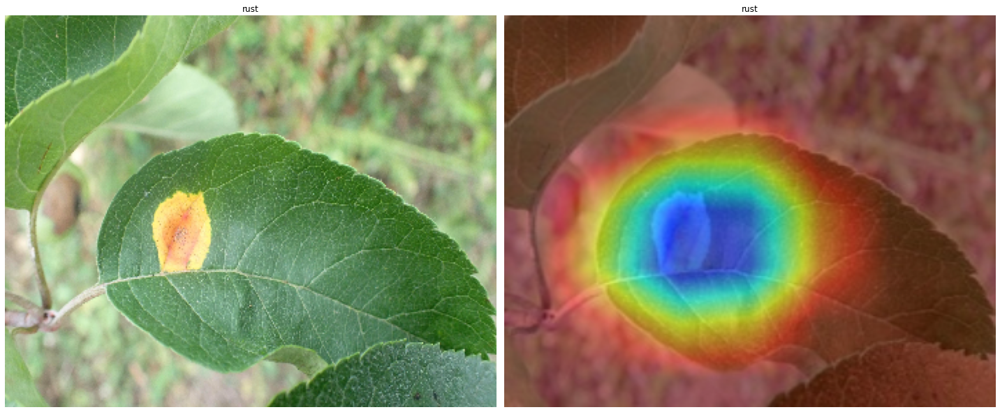

In [39]:
show_feature(df_test,'rust', test_path,test_fea_path,cam)

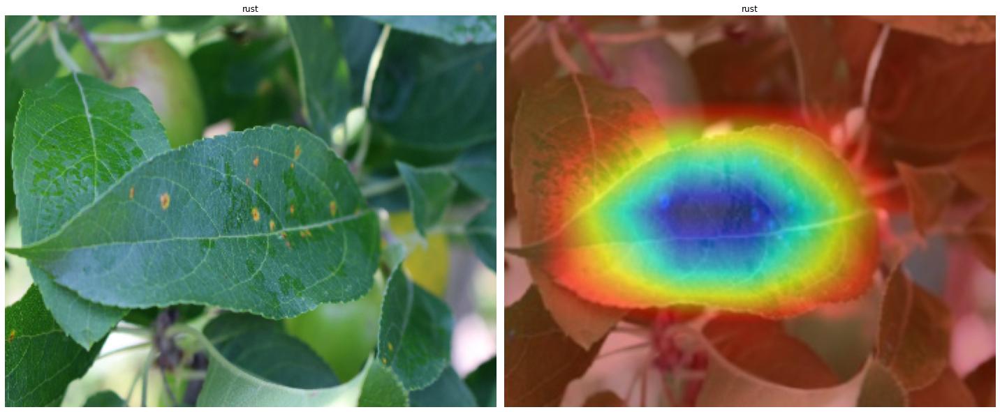

In [41]:
show_feature(df_test,'rust', test_path,test_fea_path,cam)

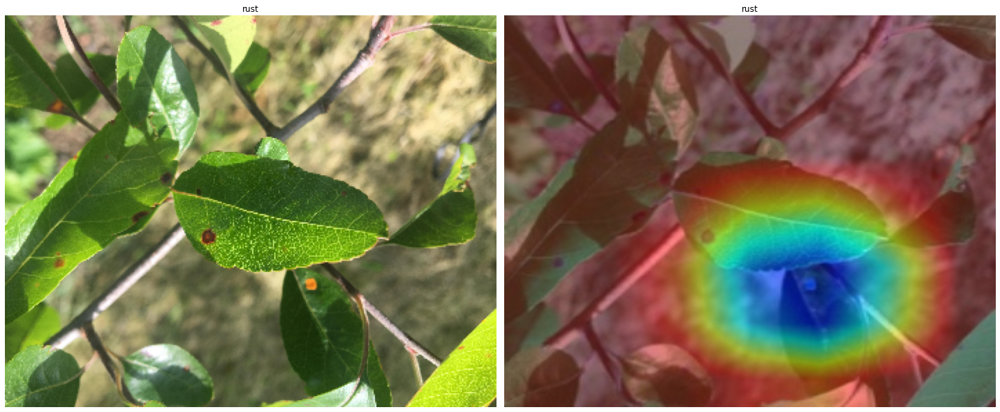

In [42]:
show_feature(df_test,'rust', test_path,test_fea_path,cam)

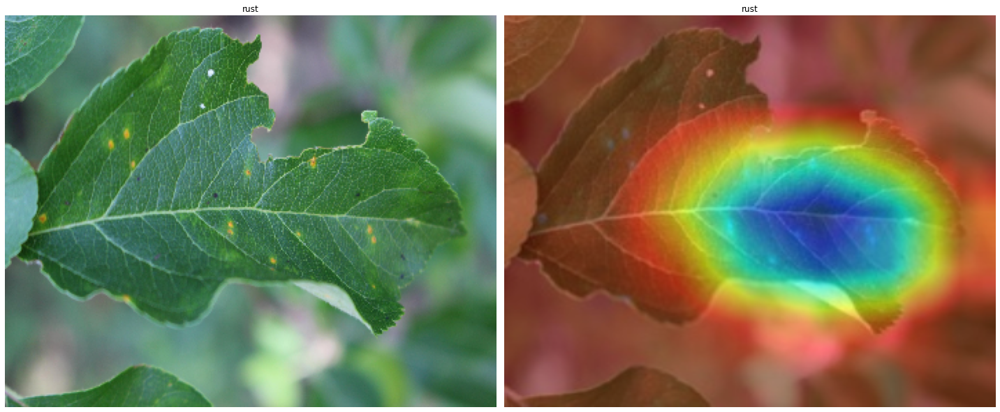

In [43]:
show_feature(df_test,'rust', test_path,test_fea_path,cam)

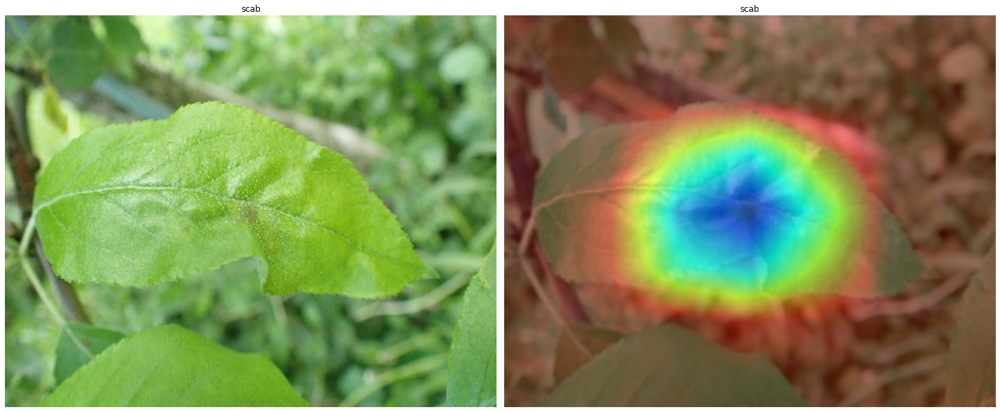

In [44]:
show_feature(df_test,'scab', test_path,test_fea_path,cam)

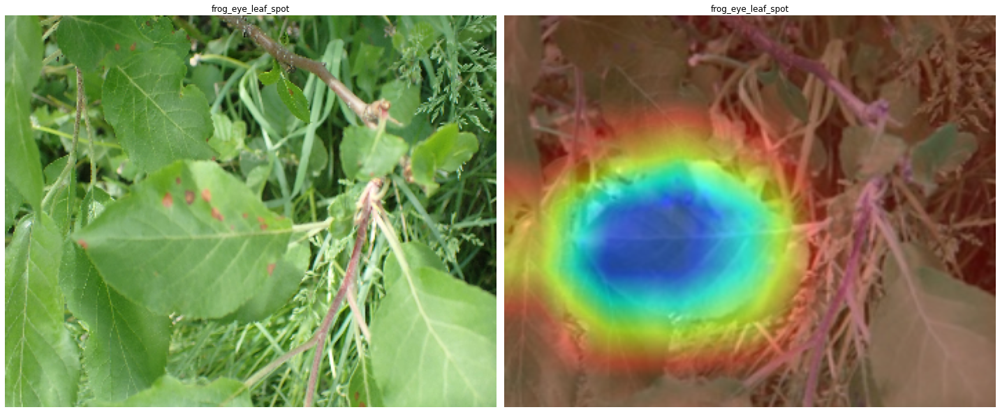

In [45]:
show_feature(df_test,'frog_eye_leaf_spot', test_path,test_fea_path,cam)

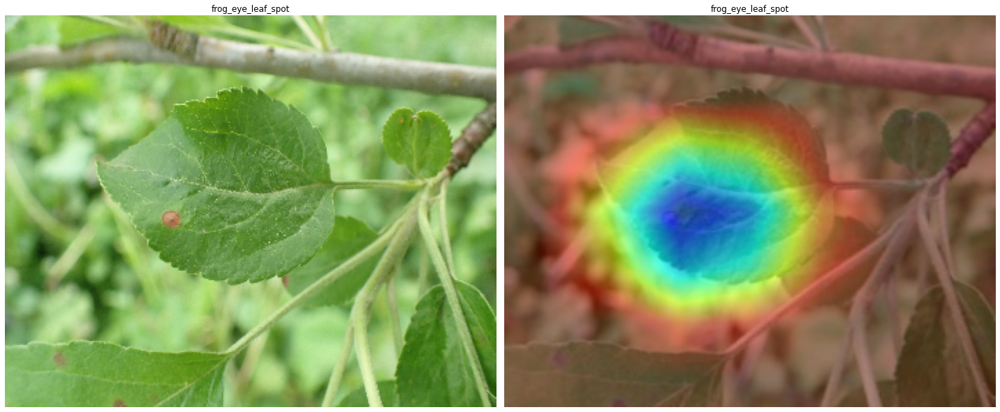

In [46]:
show_feature(df_test,'frog_eye_leaf_spot', test_path,test_fea_path,cam)

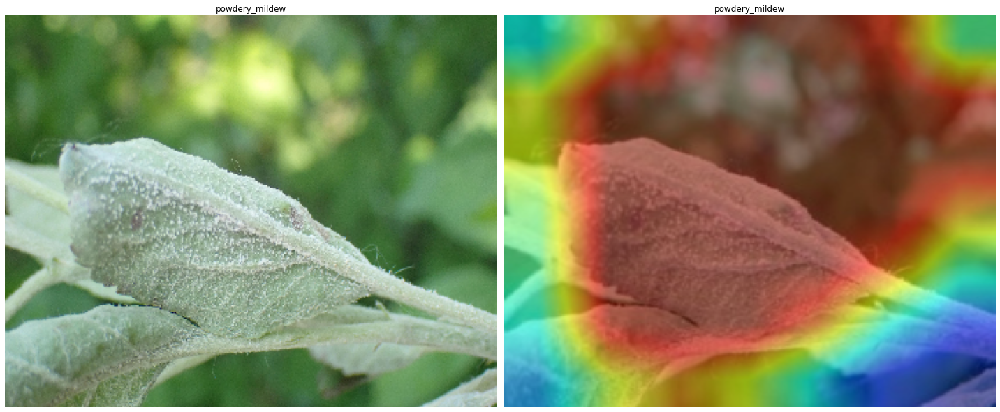

In [47]:
show_feature(df_test,'powdery_mildew', test_path,test_fea_path,cam)

In [96]:
import numpy as np
from collections import Counter
data = np.array(df_test)
Counter(data[:,1])

Counter({'powdery_mildew': 34,
         'complex': 52,
         'scab': 160,
         'healthy': 145,
         'frog_eye_leaf_spot': 105,
         'rust': 65,
         'scab frog_eye_leaf_spot': 26,
         'frog_eye_leaf_spot complex': 5,
         'rust complex': 2,
         'rust frog_eye_leaf_spot': 2,
         'scab frog_eye_leaf_spot complex': 4})

In [21]:
total_rows=32
all_rows = torch.arange(total_rows)
matching_rows=torch.tensor([1,2,30])
print(all_rows)
incorrect_rows = torch.masked_select(all_rows, torch.logical_not(torch.isin(all_rows, matching_rows)))
print("Incorrectly predicted rows:", incorrect_rows.tolist())
batch_acc=1-len(incorrect_rows.tolist())/total_rows
print(f'batch accuracy:{batch_acc:.2%}')

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])
Incorrectly predicted rows: [0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31]
batch accuracy:9.38%
